In [1]:
import glob
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
import numpy as np
from regions import Regions
from astropy.nddata import Cutout2D
import astropy.units as u
import matplotlib.pyplot as plt
from astropy.visualization import simple_norm
from astropy.table import Table
image_filenames ={
    "f140m": "/orange/adamginsburg/jwst/w51/F140M/pipeline/jw06151-o001_t001_nircam_clear-f140m-merged_i2d.fits",
    "f150w": "/orange/adamginsburg/jwst/w51/F150W/pipeline/jw06151-o001_t001_nircam_clear-f150w-merged_i2d.fits",
    "f162m": "/orange/adamginsburg/jwst/w51/F162M/pipeline/jw06151-o001_t001_nircam_clear-f162m-merged_i2d.fits",
    "f182m": "/orange/adamginsburg/jwst/w51/F182M/pipeline/jw06151-o001_t001_nircam_clear-f182m-merged_i2d.fits",
    "f187n": "/orange/adamginsburg/jwst/w51/F187N/pipeline/jw06151-o001_t001_nircam_clear-f187n-merged_i2d.fits",
    "f210m": "/orange/adamginsburg/jwst/w51/F210M/pipeline/jw06151-o001_t001_nircam_clear-f210m-merged_i2d.fits",
    "f335m": "/orange/adamginsburg/jwst/w51/F335M/pipeline/jw06151-o001_t001_nircam_clear-f335m-merged_i2d.fits",
    "f360m": "/orange/adamginsburg/jwst/w51/F360M/pipeline/jw06151-o001_t001_nircam_clear-f360m-merged_i2d.fits",
    "f405n": "/orange/adamginsburg/jwst/w51/F405N/pipeline/jw06151-o001_t001_nircam_clear-f405n-merged_i2d.fits",
    "f410m": "/orange/adamginsburg/jwst/w51/F410M/pipeline/jw06151-o001_t001_nircam_clear-f410m-merged_i2d.fits", 
    "f480m": "/orange/adamginsburg/jwst/w51/F480M/pipeline/jw06151-o001_t001_nircam_clear-f480m-merged_i2d.fits",
    "f560w": "/orange/adamginsburg/jwst/w51/F560W/pipeline/jw06151-o002_t001_miri_f560w_i2d.fits",
    "f770w": "/orange/adamginsburg/jwst/w51/F770W/pipeline/jw06151-o002_t001_miri_f770w_i2d.fits",
    "f1000w": "/orange/adamginsburg/jwst/w51/F1000W/pipeline/jw06151-o002_t001_miri_f1000w_i2d.fits",
    "f1280w": "/orange/adamginsburg/jwst/w51/F1280W/pipeline/jw06151-o002_t001_miri_f1280w_i2d.fits",
    "f1500w": "/orange/adamginsburg/jwst/w51/F1500W/pipeline/jw06151-o002_t001_miri_f1500w_i2d.fits",
    "f2100w": "/orange/adamginsburg/jwst/w51/F2100W/pipeline/jw06151-o002_t001_miri_f2100w_i2d.fits",
    
}



nrca_catalog=Table.read(f'/orange/adamginsburg/jwst/w51/catalogs/f480m_nrca_indivexp_merged_dao_after_merger_combined_with_satstars.fits')

#nrca_catalog = Table.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/basic_nrca_indivexp_photometry_tables_merged.fits')
#nrcb_catalog = Table.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/basic_nrcb_indivexp_photometry_tables_merged.fits')
#catalog_f140m_nrca = Table.read()
#nrca_catalog = Table.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/f480m_nrca_indivexp_merged_dao_basic.fits')
#nrcb_catalog = Table.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/f480m_nrcb_indivexp_merged_dao_basic.fits')
test_regions = Regions.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/f140m_refine_test.reg', format='crtf')
by_eye_sources = Regions.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/by_eye_star_f480m.reg', format='crtf')

ra_reg = []
dec_reg = []
for reg in by_eye_sources:
    ra_reg.append(reg.center.ra.deg)
    dec_reg.append(reg.center.dec.deg)
by_eye_skycoord = SkyCoord(ra=ra_reg*u.deg, dec=dec_reg*u.deg, frame='icrs')


331 52106 331
[20344 19794 20096 20050 19936 19873 19607 20276 20184 19893 19942 19831
 19461 19198 19267 19373 19256 19164 19304 19292 19186 19125 19028 19061
 51221 19361 19145 18710 18695 18771 18743 18744 18802 18849 18582 18627
 19509 19674 19981 19557 19610 19592 19575 19457 20327 20356 20151 19271
 19335 19468 18953 18986 18928 18994 18993 18919 18801 18863 19078 19094
 19124 19209 19314 18727 18670 18749 18694 18720 18742 18730 18797 18873
 18859 18831 18813 18904 18894 19010 18905 19095 41005 41015 41068 41067
 41076 41026 41012 41014 41031 45135 41007 41039 41072 41053 41095 50096
 41094 41123 41106 41011 41066 41103 41088 41134 41147 41209 41182 41019
 41138 41108 41045 41158 41154 41143 41141 41126 41090 41214 41188 41178
 41167 41113 41192 41264 41247 41295 41291 41240 41271 41306 41278 41226
 41181 41186 41179 41193 41174 41273 41177 41261 51819 41122 41446 41448
 41418 41406 41391 41369 41381 41471 41475 45289 41488 41396 41324 41302
 41286 45213 41215 41617 41594 41666 

Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


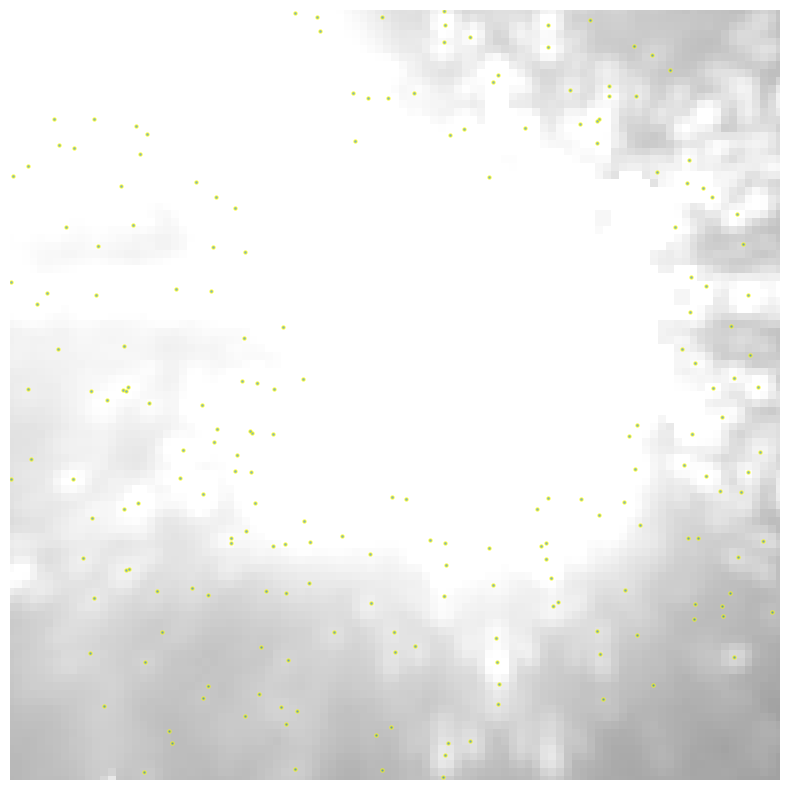

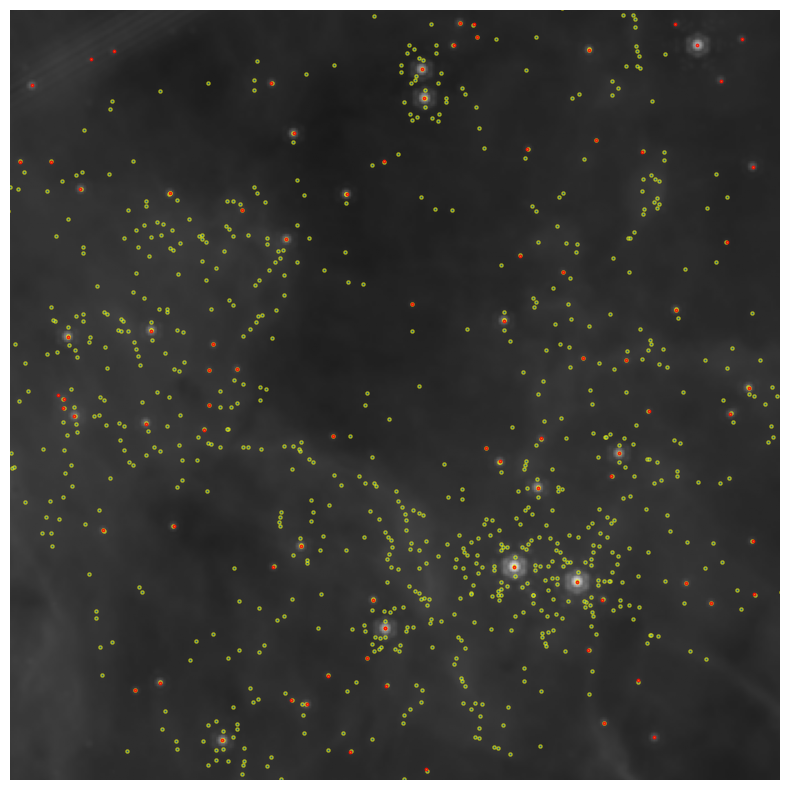

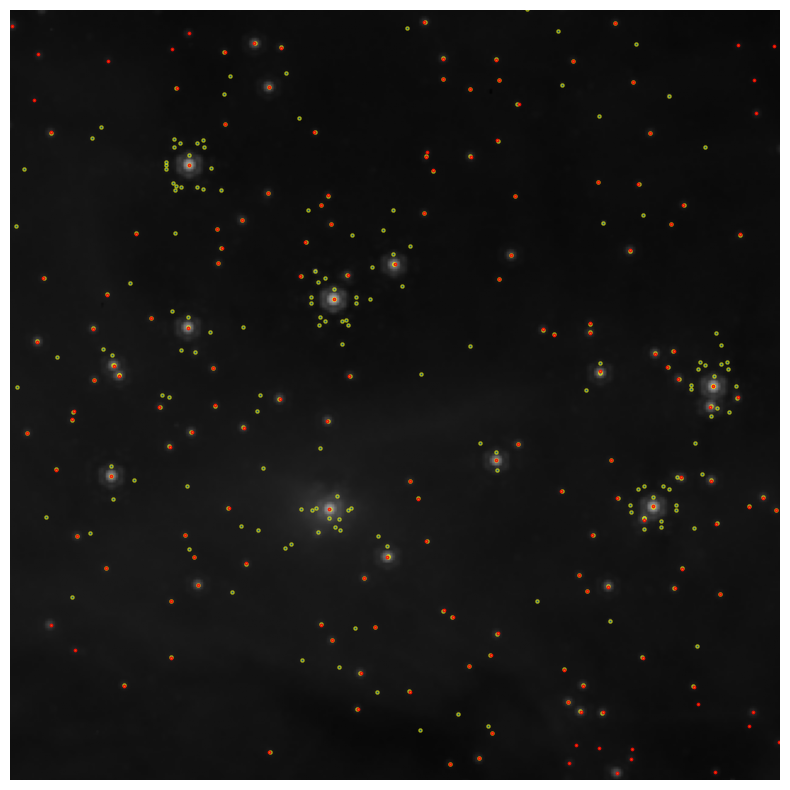

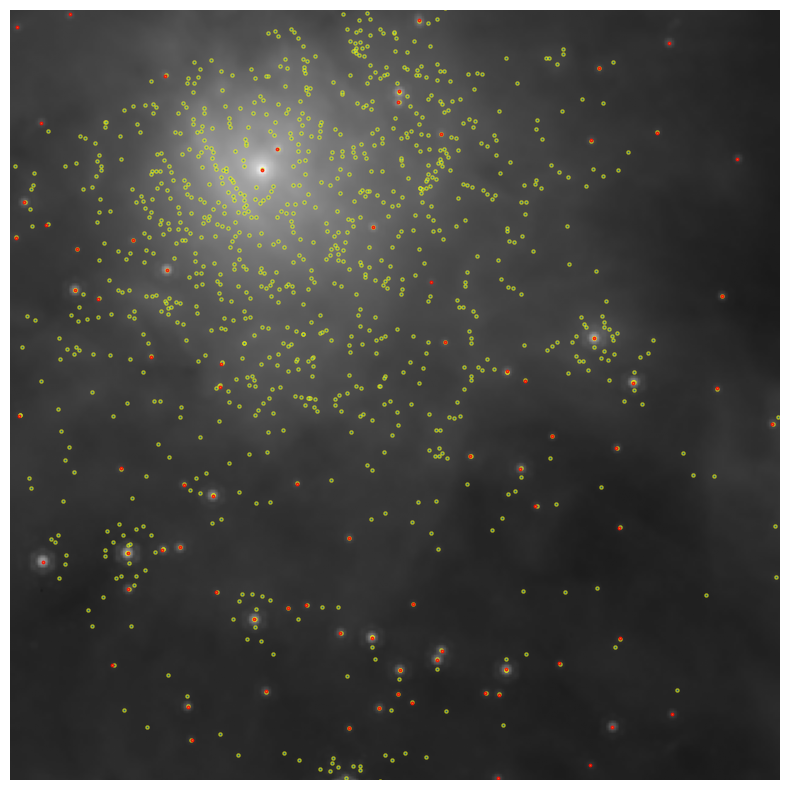

In [2]:
idx, d2d, d3d = by_eye_skycoord.match_to_catalog_sky(nrca_catalog['skycoord'])
print(len(idx), len(nrca_catalog['skycoord']), len(by_eye_skycoord))
print(idx)
matched = d2d < 0.1*u.arcsec
print(f'{len(matched==True)} sources out of {len(matched)} matched within 0.1 arcsec')
matched_skycoord = nrca_catalog['skycoord'][idx[matched]]
contains_arr = np.zeros(len(nrca_catalog['skycoord']), dtype=bool)
for reg in test_regions:
    filename = image_filenames['f480m']
    hdu = fits.open(filename)
    data = hdu[1].data if len(hdu) > 1 else hdu[0].data
    wcs = WCS(hdu[1].header if len(hdu) > 1 else hdu[0].header)
    cutout = Cutout2D(data, reg.center, (reg.height, reg.width), wcs=wcs)
    norm = simple_norm(data, 'log', percent=99.95)
    fig, ax = plt.subplots(1, 1, figsize=(10, 10), subplot_kw={'projection': cutout.wcs})
    ax.imshow(cutout.data, norm=norm, origin='lower', cmap='gray')
    skycoord_ref = nrca_catalog['skycoord']
    contains = reg.contains(skycoord_ref, wcs)
    contains_arr[contains] = True
    #convert skycoordinates to pixel coordinates in the cutout
    pixcoords_matched = cutout.wcs.world_to_pixel(matched_skycoord)
    pixcoords_by_eye_skycoord = cutout.wcs.world_to_pixel(by_eye_skycoord)
    pixcoords_in_reg = cutout.wcs.world_to_pixel(skycoord_ref[contains])
    ra = pixcoords_in_reg[0]
    dec = pixcoords_in_reg[1]
    ax.scatter(ra, dec, s=5, edgecolor='yellow', alpha=0.6) 

    
    ra = pixcoords_by_eye_skycoord[0]
    dec = pixcoords_by_eye_skycoord[1]
    ax.scatter(ra, dec, s=3, edgecolor='red', alpha=0.8)
    
    #ra = pixcoords[0][index] --- IGNORE
    ax.axis('off')
    ax.set_xlim(cutout.xmin_cutout, cutout.xmax_cutout)
    ax.set_ylim(cutout.ymin_cutout, cutout.ymax_cutout)

Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
/scratch/local/23155831/ipykernel_2167173/2647184799.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap1 = cm.get_cmap('viridis')
/scratch/local/23155831/ipykernel_2167173/2647184799.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap2 = cm.get_cmap('plasma')
/scratch/local/23155831/ipykernel_2167173/2647184799.py:27: MatplotlibDeprecationWarning: The get_cmap function was depreca

331 sources out of 331 matched within 0.1 arcsec
331 sources out of 331 matched within 0.1 arcsec


/scratch/local/23155831/ipykernel_2167173/2647184799.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap1 = cm.get_cmap('viridis')
/scratch/local/23155831/ipykernel_2167173/2647184799.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap2 = cm.get_cmap('plasma')


331 sources out of 331 matched within 0.1 arcsec


/scratch/local/23155831/ipykernel_2167173/2647184799.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap1 = cm.get_cmap('viridis')
/scratch/local/23155831/ipykernel_2167173/2647184799.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap2 = cm.get_cmap('plasma')


331 sources out of 331 matched within 0.1 arcsec


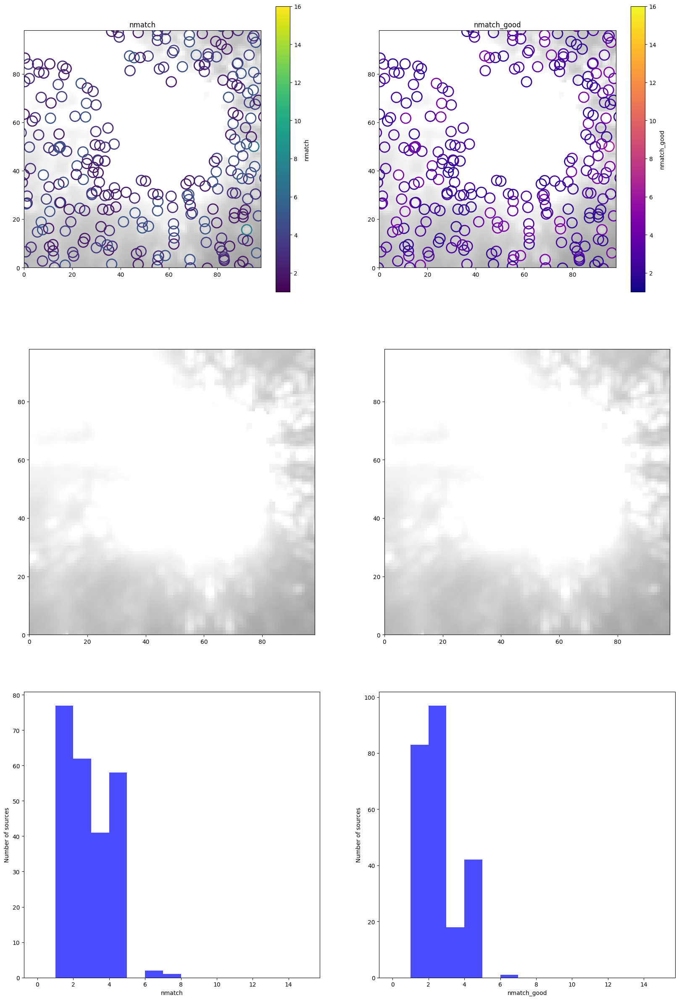

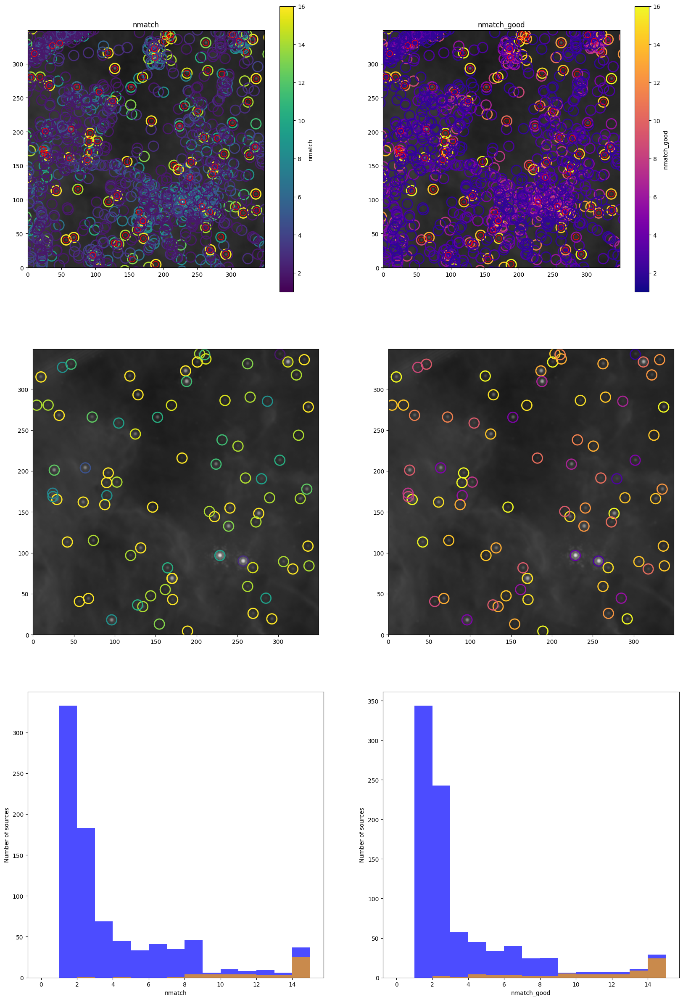

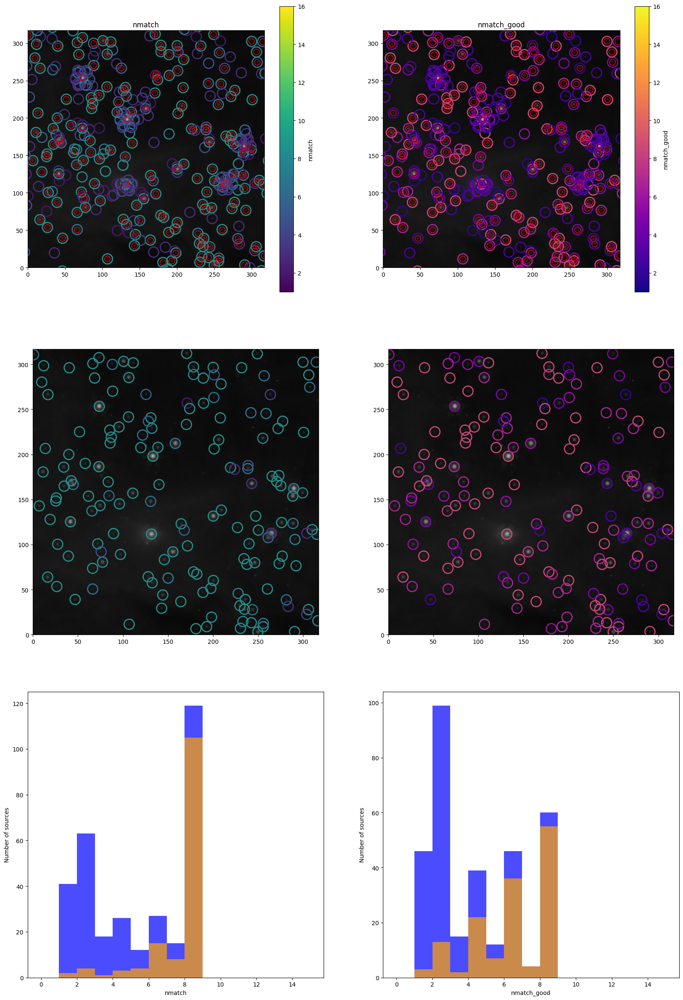

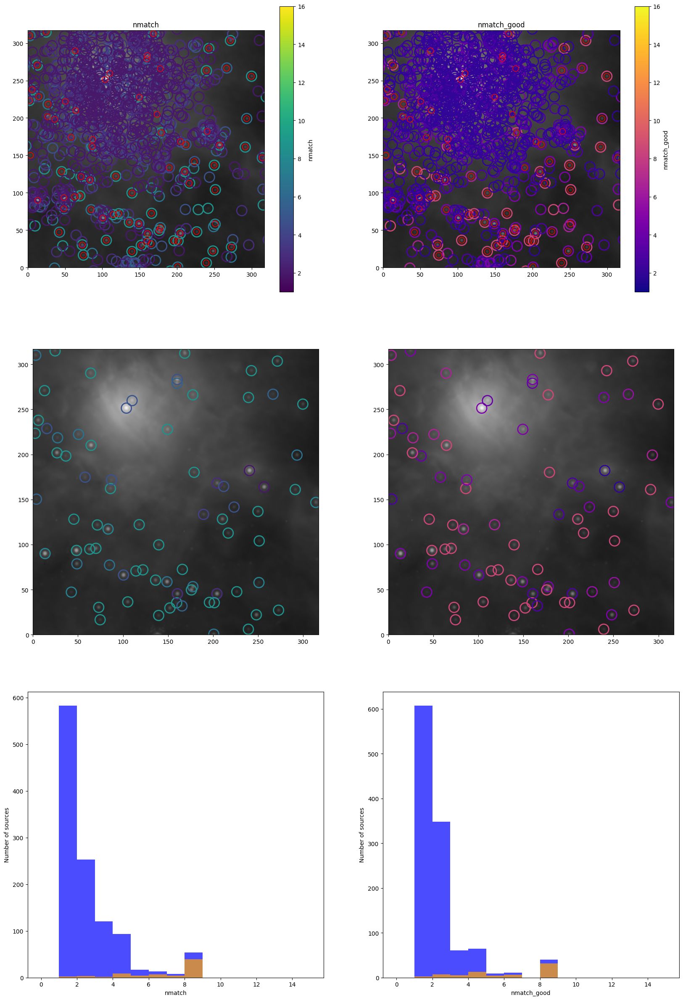

In [3]:
filename = image_filenames['f480m']
hdu = fits.open(filename)
data = hdu[1].data if len(hdu) > 1 else hdu[0].data
wcs = WCS(hdu[1].header if len(hdu) > 1 else hdu[0].header)
norm = simple_norm(data, 'log', percent=99.95)
skycoords = nrca_catalog['skycoord']
for reg in test_regions:
    cutout = Cutout2D(data, reg.center, (reg.height, reg.width), wcs=wcs)
    xpix, ypix = wcs.world_to_pixel(skycoords)
    xpix_by_eye, ypix_by_eye = wcs.world_to_pixel(by_eye_skycoord)




    fig = plt.figure(figsize=(20,30))
    ax1 = fig.add_subplot(3,2,1,)
    ax2 = fig.add_subplot(3,2,2,)
    ax5 = fig.add_subplot(3,2,3,)
    ax6 = fig.add_subplot(3,2,4,)
    ax3 = fig.add_subplot(3,2,5)
    ax4 = fig.add_subplot(3,2,6)
    

    nmatch = nrca_catalog['nmatch']
    nmatch_good = nrca_catalog['nmatch_good']
    import matplotlib.cm as cm
    cmap1 = cm.get_cmap('viridis')
    cmap2 = cm.get_cmap('plasma')

    ax1.imshow(cutout.data, norm=norm, origin='lower', cmap='gray')
    ax2.imshow(cutout.data, norm=norm, origin='lower', cmap='gray')
    ax5.imshow(cutout.data, norm=norm, origin='lower', cmap='gray')
    ax6.imshow(cutout.data, norm=norm, origin='lower', cmap='gray')
    
    
    # Remove 'c' parameter, only use edgecolors
    sc1 = ax1.scatter(xpix-cutout.xmin_original, ypix-cutout.ymin_original, s=300, facecolors='none', edgecolors=cmap1(nmatch/nmatch.max()), linewidths=2, label='nmatch')
    sc2 = ax2.scatter(xpix-cutout.xmin_original, ypix-cutout.ymin_original, s=300, facecolors='none', edgecolors=cmap2(nmatch_good/nmatch_good.max()), linewidths=2, label='nmatch_good')
    ax1.scatter(xpix_by_eye - cutout.xmin_original, ypix_by_eye - cutout.ymin_original, s=100, facecolors='none', edgecolors='red', linewidths=1, label='by eye sources')
    ax2.scatter(xpix_by_eye - cutout.xmin_original, ypix_by_eye - cutout.ymin_original, s=100, facecolors='none', edgecolors='red', linewidths=1, label='by eye sources')
    ax1.set_xlim(cutout.xmin_cutout, cutout.xmax_cutout)
    ax1.set_ylim(cutout.ymin_cutout, cutout.ymax_cutout)
    ax2.set_xlim(cutout.xmin_cutout, cutout.xmax_cutout)
    ax2.set_ylim(cutout.ymin_cutout, cutout.ymax_cutout)
    ax1.set_title('nmatch')

    ax2.set_title('nmatch_good')
    # For colorbar, create a ScalarMappable
    import matplotlib as mpl
    sm1 = mpl.cm.ScalarMappable(cmap=cmap1, norm=mpl.colors.Normalize(vmin=nmatch.min(), vmax=nmatch.max()))
    sm2 = mpl.cm.ScalarMappable(cmap=cmap2, norm=mpl.colors.Normalize(vmin=nmatch_good.min(), vmax=nmatch_good.max()))
    plt.colorbar(sm1, ax=ax1, label='nmatch')
    plt.colorbar(sm2, ax=ax2, label='nmatch_good')

    idx, d2d, d3d = by_eye_skycoord.match_to_catalog_sky(skycoords)
    matched = d2d < 0.1*u.arcsec
    matched_skycoord = skycoords[idx[matched]]  
    print(len(matched==True), 'sources out of', len(matched), 'matched within 0.1 arcsec')
    xpix_matched, ypix_matched = wcs.world_to_pixel(matched_skycoord)
    sc1 = ax5.scatter(xpix_matched-cutout.xmin_original, ypix_matched-cutout.ymin_original, s=300, facecolors='none', edgecolors=cmap1(nmatch[idx[matched]]  /nmatch.max()), linewidths=2, label='nmatch')
    sc2 = ax6.scatter(xpix_matched-cutout.xmin_original, ypix_matched-cutout.ymin_original, s=300, facecolors='none', edgecolors=cmap2(nmatch_good[idx[matched]] /nmatch_good.max()), linewidths=2, label='nmatch_good')
    ax5.set_xlim(cutout.xmin_cutout, cutout.xmax_cutout)
    ax5.set_ylim(cutout.ymin_cutout, cutout.ymax_cutout)
    ax6.set_xlim(cutout.xmin_cutout, cutout.xmax_cutout)

    ax6.set_ylim(cutout.ymin_cutout, cutout.ymax_cutout)
    hist_bins = np.arange(16)
    contains = reg.contains(skycoords, wcs)
    containes_matched = reg.contains(skycoords[idx[matched]], wcs)
    ax3.hist(nrca_catalog['nmatch'][contains], bins=hist_bins, color='blue', alpha=0.7)
    ax3.hist(nrca_catalog['nmatch'][idx[matched]][containes_matched], bins=hist_bins, color='orange', alpha=0.7)
    ax3.set_xlabel('nmatch')
    ax3.set_ylabel('Number of sources')
    ax4.hist(nrca_catalog['nmatch_good'][contains], bins=hist_bins, color='blue', alpha=0.7)
    ax4.hist(nrca_catalog['nmatch_good'][idx[matched]][containes_matched], bins=hist_bins, color='orange', alpha=0.7)
    ax4.set_xlabel('nmatch_good')
    ax4.set_ylabel('Number of sources')
    

    

In [4]:
# do the same thing for F140M

nrca_catalog=Table.read(f'/orange/adamginsburg/jwst/w51/catalogs/f140m_nrca_indivexp_merged_dao_after_merger_combined_with_satstars.fits')

#nrca_catalog = Table.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/basic_nrca_indivexp_photometry_tables_merged.fits')
#nrcb_catalog = Table.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/basic_nrcb_indivexp_photometry_tables_merged.fits')
#catalog_f140m_nrca = Table.read()
#nrca_catalog = Table.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/f480m_nrca_indivexp_merged_dao_basic.fits')
#nrcb_catalog = Table.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/f480m_nrcb_indivexp_merged_dao_basic.fits')
test_regions = Regions.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/f140m_refine_test.reg', format='crtf')
by_eye_sources = Regions.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/by_eye_star_f140m.reg', format='crtf')

ra_reg = []
dec_reg = []
for reg in by_eye_sources:
    ra_reg.append(reg.center.ra.deg)
    dec_reg.append(reg.center.dec.deg)
by_eye_skycoord = SkyCoord(ra=ra_reg*u.deg, dec=dec_reg*u.deg, frame='icrs')

426 62351 426
[21776 21794 21646 21402 21325 21303 21321 21262 21306 21378 21222 21116
 23152 23149 21666 21483 21563 21578 21491 21653 21766 21791 21783 21729
 21697 21677 21625 21602 21569 21710 21260 21239 21263 21341 21518 21345
 21235 21206 21121 21107 21087 21096 21085 21003 20933 20912 20843 21009
 21061 21077 20489 20480 20592 20745 20677 20755 20748 20670 20219 20531
 20631 20506 20635 20569 20632 20533 20063 20154 20097 20149 20171 20324
 20537 20461 20389 20241 20062 20040 20210 20214 20328 61238 61269 61258
 61214 61213 61196 61181 61165 61305 61287 52573 52526 20877 20777 21039
 21066 20995 20862 21005 20981 20941 61335 61357 20827 21120 61349 61323
 52739 61376 61385 61415 61412 61378 21101 21093 61454 61509 61544 61526
 61564 61550 61576 61586 61590 53957 53341 61505 61557 53488 61449 48587
 48540 48505 48419 48323 48220 48258 48219 48186 48251 48363 48073 48095
 47982 48004 48200 48208 48152 47946 47847 47728 47696 47703 47627 47434
 47518 47422 47403 47364 47322 47324 

Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


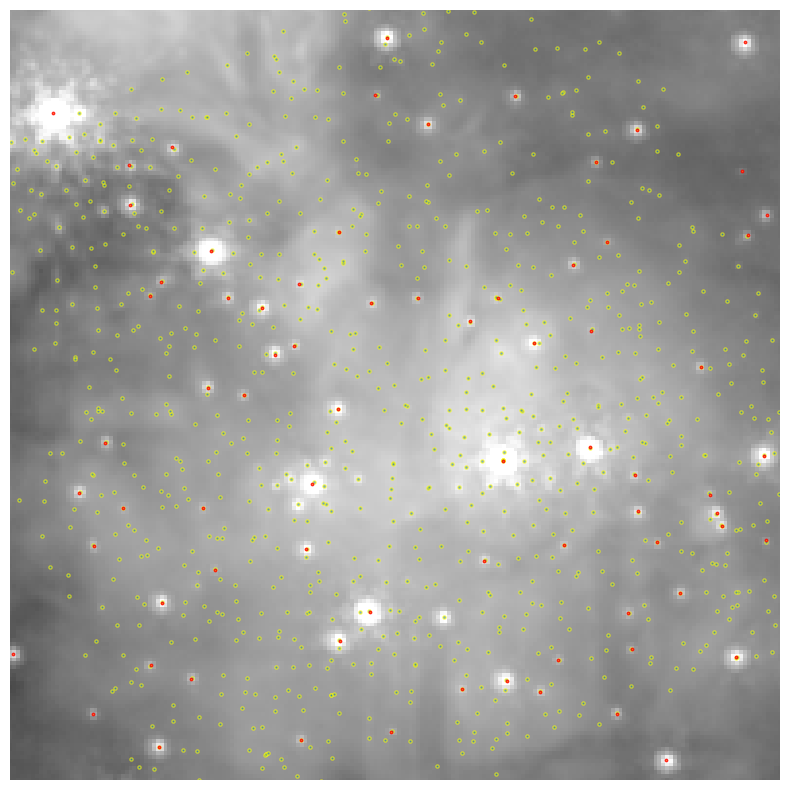

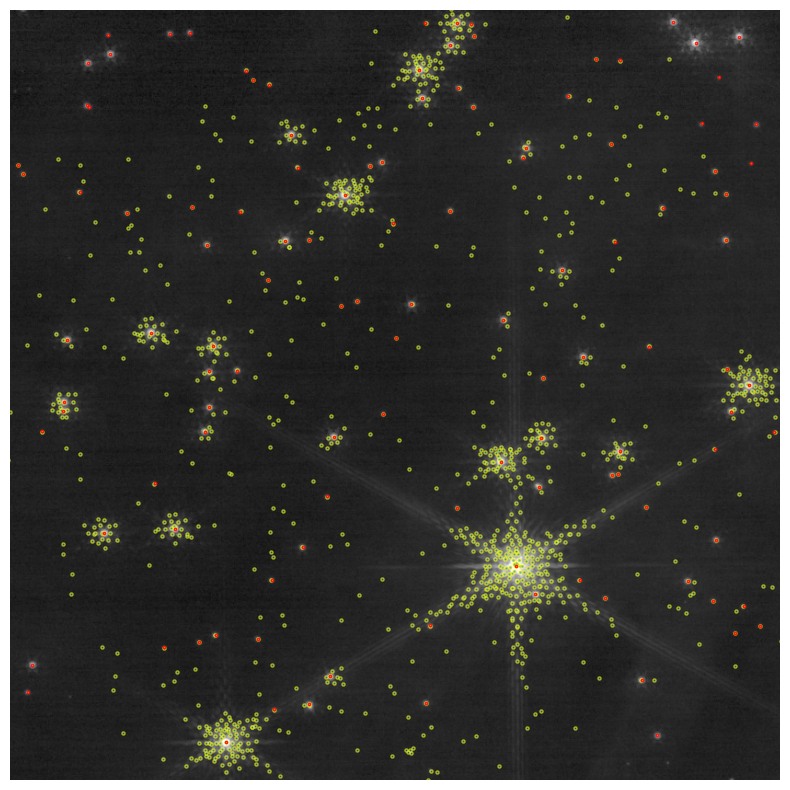

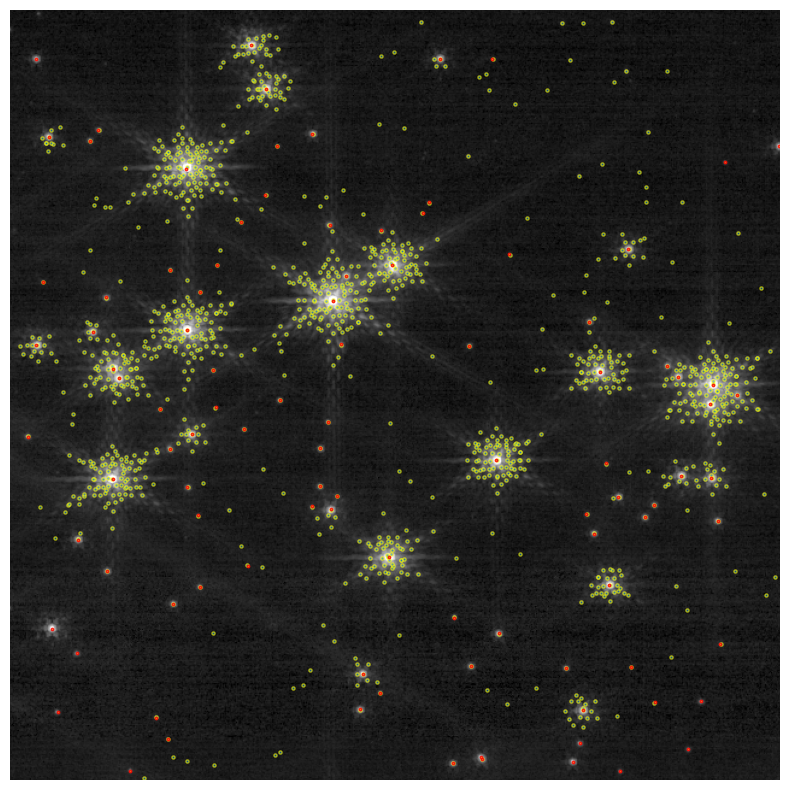

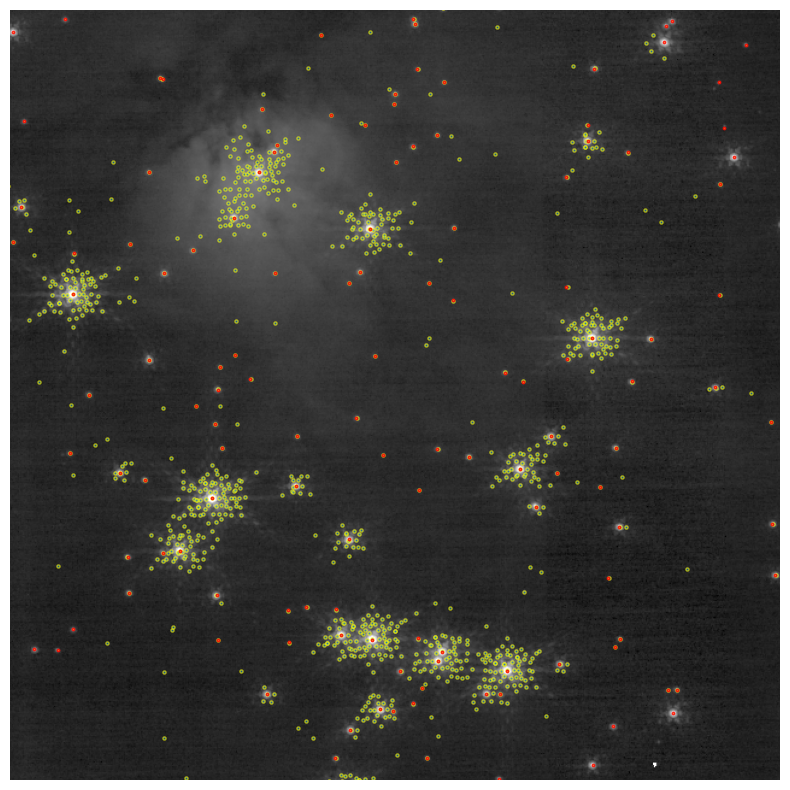

In [5]:
idx, d2d, d3d = by_eye_skycoord.match_to_catalog_sky(nrca_catalog['skycoord'])
print(len(idx), len(nrca_catalog['skycoord']), len(by_eye_skycoord))
print(idx)
matched = d2d < 0.1*u.arcsec
print(f'{len(matched==True)} sources out of {len(matched)} matched within 0.1 arcsec')
matched_skycoord = nrca_catalog['skycoord'][idx[matched]]
contains_arr = np.zeros(len(nrca_catalog['skycoord']), dtype=bool)
for reg in test_regions:
    filename = image_filenames['f140m']
    hdu = fits.open(filename)
    data = hdu[1].data if len(hdu) > 1 else hdu[0].data
    wcs = WCS(hdu[1].header if len(hdu) > 1 else hdu[0].header)
    cutout = Cutout2D(data, reg.center, (reg.height, reg.width), wcs=wcs)
    norm = simple_norm(data, 'log', percent=99.9)
    fig, ax = plt.subplots(1, 1, figsize=(10, 10), subplot_kw={'projection': cutout.wcs})
    ax.imshow(cutout.data, norm=norm, origin='lower', cmap='gray')
    skycoord_ref = nrca_catalog['skycoord']
    contains = reg.contains(skycoord_ref, wcs)
    contains_arr[contains] = True
    #convert skycoordinates to pixel coordinates in the cutout
    pixcoords_matched = cutout.wcs.world_to_pixel(matched_skycoord)
    pixcoords_by_eye_skycoord = cutout.wcs.world_to_pixel(by_eye_skycoord)
    pixcoords_in_reg = cutout.wcs.world_to_pixel(skycoord_ref[contains])
    ra = pixcoords_in_reg[0]
    dec = pixcoords_in_reg[1]
    ax.scatter(ra, dec, s=5, edgecolor='yellow', alpha=0.6) 

    
    ra = pixcoords_by_eye_skycoord[0]
    dec = pixcoords_by_eye_skycoord[1]
    ax.scatter(ra, dec, s=3, edgecolor='red', alpha=0.8)
    
    #ra = pixcoords[0][index] --- IGNORE
    ax.axis('off')
    ax.set_xlim(cutout.xmin_cutout, cutout.xmax_cutout)
    ax.set_ylim(cutout.ymin_cutout, cutout.ymax_cutout)

Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


/scratch/local/23155831/ipykernel_2167173/3253417764.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap1 = cm.get_cmap('viridis')
/scratch/local/23155831/ipykernel_2167173/3253417764.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap2 = cm.get_cmap('plasma')
/scratch/local/23155831/ipykernel_2167173/3253417764.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap1 = cm.get_cmap('viridis')
/scratch/local/23155831/ipykernel_2167173/3253417764.py:

426 sources out of 426 matched within 0.1 arcsec
426 sources out of 426 matched within 0.1 arcsec


/scratch/local/23155831/ipykernel_2167173/3253417764.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap1 = cm.get_cmap('viridis')
/scratch/local/23155831/ipykernel_2167173/3253417764.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap2 = cm.get_cmap('plasma')
/scratch/local/23155831/ipykernel_2167173/3253417764.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap1 = cm.get_cmap('viridis')
/scratch/local/23155831/ipykernel_2167173/3253417764.py:

426 sources out of 426 matched within 0.1 arcsec
426 sources out of 426 matched within 0.1 arcsec


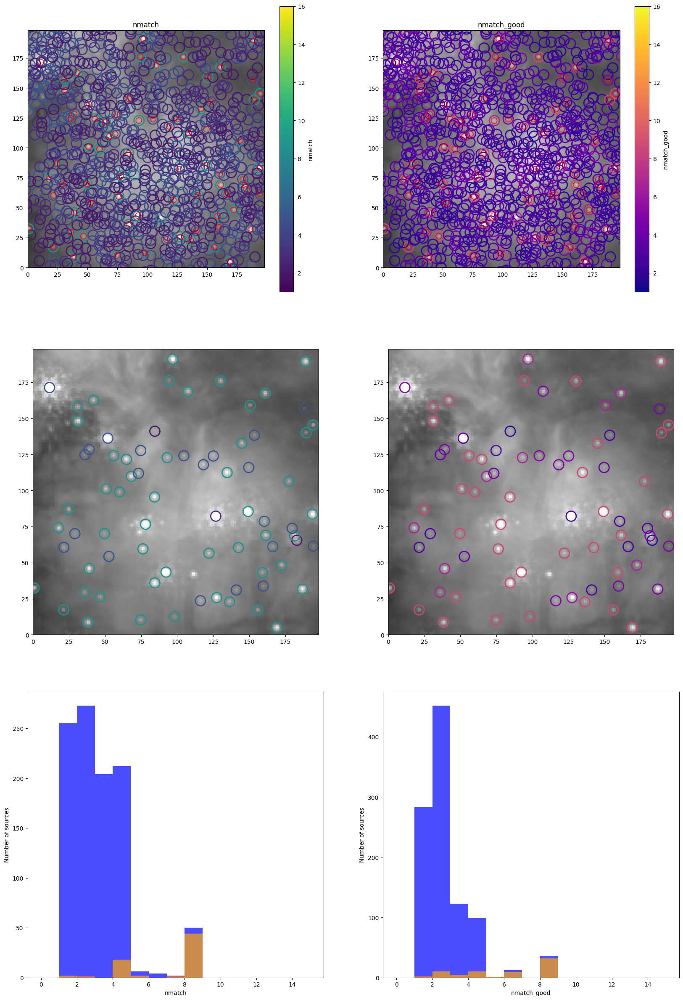

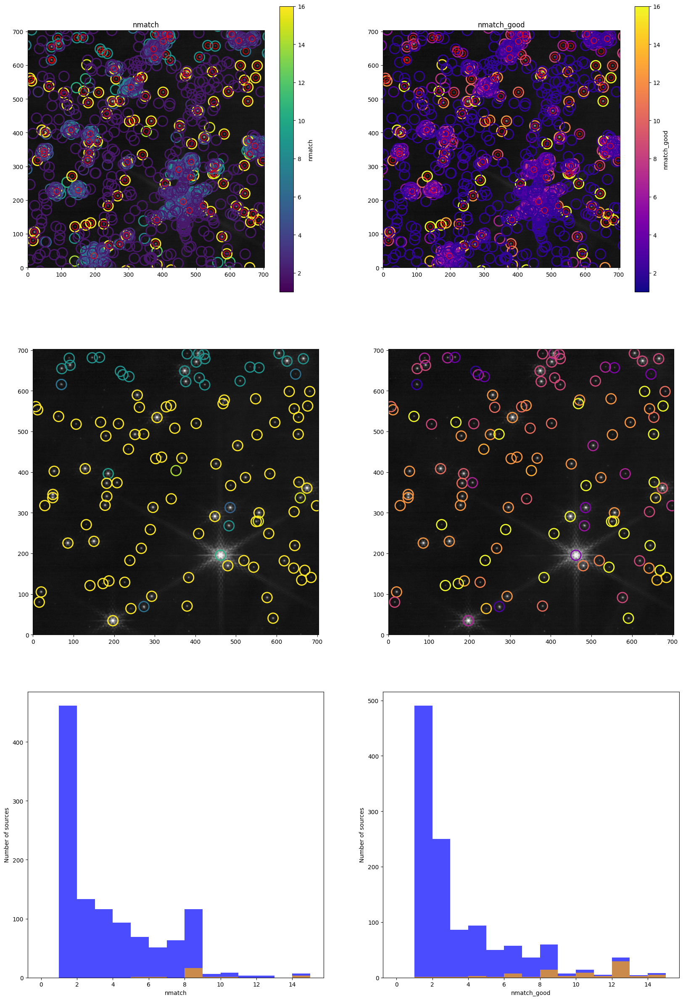

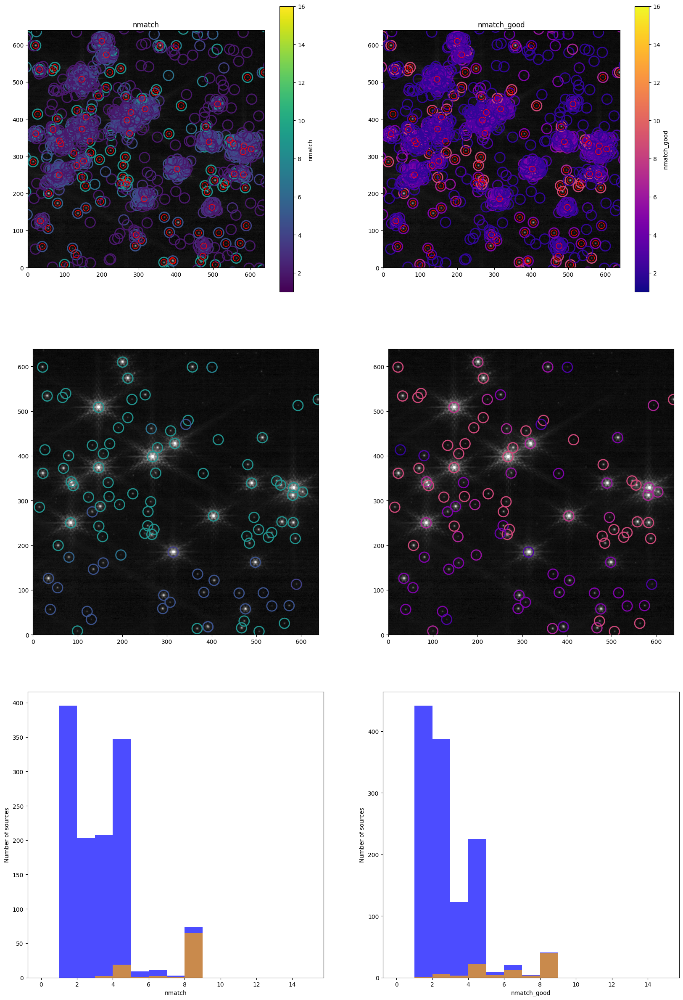

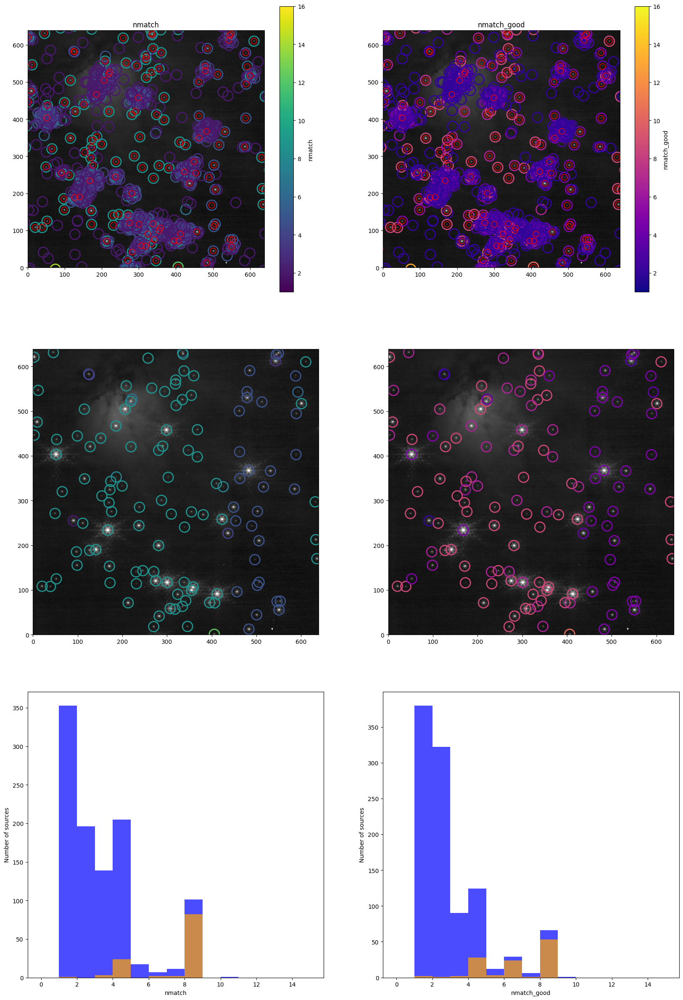

In [6]:
filename = image_filenames['f140m']
hdu = fits.open(filename)
data = hdu[1].data if len(hdu) > 1 else hdu[0].data
wcs = WCS(hdu[1].header if len(hdu) > 1 else hdu[0].header)
norm = simple_norm(data, 'log', percent=99.95)
skycoords = nrca_catalog['skycoord']
for reg in test_regions:
    cutout = Cutout2D(data, reg.center, (reg.height, reg.width), wcs=wcs)
    xpix, ypix = wcs.world_to_pixel(skycoords)
    xpix_by_eye, ypix_by_eye = wcs.world_to_pixel(by_eye_skycoord)




    fig = plt.figure(figsize=(20,30))
    ax1 = fig.add_subplot(3,2,1,)
    ax2 = fig.add_subplot(3,2,2,)
    ax5 = fig.add_subplot(3,2,3,)
    ax6 = fig.add_subplot(3,2,4,)
    ax3 = fig.add_subplot(3,2,5)
    ax4 = fig.add_subplot(3,2,6)
    

    nmatch = nrca_catalog['nmatch']
    nmatch_good = nrca_catalog['nmatch_good']
    import matplotlib.cm as cm
    cmap1 = cm.get_cmap('viridis')
    cmap2 = cm.get_cmap('plasma')

    ax1.imshow(cutout.data, norm=norm, origin='lower', cmap='gray')
    ax2.imshow(cutout.data, norm=norm, origin='lower', cmap='gray')
    ax5.imshow(cutout.data, norm=norm, origin='lower', cmap='gray')
    ax6.imshow(cutout.data, norm=norm, origin='lower', cmap='gray')
    
    
    # Remove 'c' parameter, only use edgecolors
    sc1 = ax1.scatter(xpix-cutout.xmin_original, ypix-cutout.ymin_original, s=300, facecolors='none', edgecolors=cmap1(nmatch/nmatch.max()), linewidths=2, label='nmatch')
    sc2 = ax2.scatter(xpix-cutout.xmin_original, ypix-cutout.ymin_original, s=300, facecolors='none', edgecolors=cmap2(nmatch_good/nmatch_good.max()), linewidths=2, label='nmatch_good')
    ax1.scatter(xpix_by_eye - cutout.xmin_original, ypix_by_eye - cutout.ymin_original, s=100, facecolors='none', edgecolors='red', linewidths=1, label='by eye sources')
    ax2.scatter(xpix_by_eye - cutout.xmin_original, ypix_by_eye - cutout.ymin_original, s=100, facecolors='none', edgecolors='red', linewidths=1, label='by eye sources')
    ax1.set_xlim(cutout.xmin_cutout, cutout.xmax_cutout)
    ax1.set_ylim(cutout.ymin_cutout, cutout.ymax_cutout)
    ax2.set_xlim(cutout.xmin_cutout, cutout.xmax_cutout)
    ax2.set_ylim(cutout.ymin_cutout, cutout.ymax_cutout)
    ax1.set_title('nmatch')

    ax2.set_title('nmatch_good')
    # For colorbar, create a ScalarMappable
    import matplotlib as mpl
    sm1 = mpl.cm.ScalarMappable(cmap=cmap1, norm=mpl.colors.Normalize(vmin=nmatch.min(), vmax=nmatch.max()))
    sm2 = mpl.cm.ScalarMappable(cmap=cmap2, norm=mpl.colors.Normalize(vmin=nmatch_good.min(), vmax=nmatch_good.max()))
    plt.colorbar(sm1, ax=ax1, label='nmatch')
    plt.colorbar(sm2, ax=ax2, label='nmatch_good')

    idx, d2d, d3d = by_eye_skycoord.match_to_catalog_sky(skycoords)
    matched = d2d < 0.1*u.arcsec
    matched_skycoord = skycoords[idx[matched]]  
    print(len(matched==True), 'sources out of', len(matched), 'matched within 0.1 arcsec')
    xpix_matched, ypix_matched = wcs.world_to_pixel(matched_skycoord)
    sc1 = ax5.scatter(xpix_matched-cutout.xmin_original, ypix_matched-cutout.ymin_original, s=300, facecolors='none', edgecolors=cmap1(nmatch[idx[matched]]  /nmatch.max()), linewidths=2, label='nmatch')
    sc2 = ax6.scatter(xpix_matched-cutout.xmin_original, ypix_matched-cutout.ymin_original, s=300, facecolors='none', edgecolors=cmap2(nmatch_good[idx[matched]] /nmatch_good.max()), linewidths=2, label='nmatch_good')
    ax5.set_xlim(cutout.xmin_cutout, cutout.xmax_cutout)
    ax5.set_ylim(cutout.ymin_cutout, cutout.ymax_cutout)
    ax6.set_xlim(cutout.xmin_cutout, cutout.xmax_cutout)

    ax6.set_ylim(cutout.ymin_cutout, cutout.ymax_cutout)
    hist_bins = np.arange(16)
    contains = reg.contains(skycoords, wcs)
    containes_matched = reg.contains(skycoords[idx[matched]], wcs)
    ax3.hist(nrca_catalog['nmatch'][contains], bins=hist_bins, color='blue', alpha=0.7)
    ax3.hist(nrca_catalog['nmatch'][idx[matched]][containes_matched], bins=hist_bins, color='orange', alpha=0.7)
    ax3.set_xlabel('nmatch')
    ax3.set_ylabel('Number of sources')
    ax4.hist(nrca_catalog['nmatch_good'][contains], bins=hist_bins, color='blue', alpha=0.7)
    ax4.hist(nrca_catalog['nmatch_good'][idx[matched]][containes_matched], bins=hist_bins, color='orange', alpha=0.7)
    ax4.set_xlabel('nmatch_good')
    ax4.set_ylabel('Number of sources')
    

    

In [7]:
# do the same thing for F560W

nrca_catalog=Table.read(f'/orange/adamginsburg/jwst/w51/catalogs/f560w_mirimage_indivexp_merged_dao_after_merger_combined_with_satstars_fixed.fits')

#nrca_catalog = Table.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/basic_nrca_indivexp_photometry_tables_merged.fits')
#nrcb_catalog = Table.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/basic_nrcb_indivexp_photometry_tables_merged.fits')
#catalog_f140m_nrca = Table.read()
#nrca_catalog = Table.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/f480m_nrca_indivexp_merged_dao_basic.fits')
#nrcb_catalog = Table.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/f480m_nrcb_indivexp_merged_dao_basic.fits')
test_regions = Regions.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/f560w_refine_test.reg', format='crtf')
by_eye_sources = Regions.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/by_eye_star_f560w.reg', format='crtf')

ra_reg = []
dec_reg = []
for reg in by_eye_sources:
    ra_reg.append(reg.center.ra.deg)
    dec_reg.append(reg.center.dec.deg)
by_eye_skycoord = SkyCoord(ra=ra_reg*u.deg, dec=dec_reg*u.deg, frame='icrs')

197 12000 197
[ 6713  6736  6729  6724  6718  6710  6703  6693  6710  9191  6662  6661
  6689  6688  6680  6639  6641  6635  6592  6561  6575  6588  6604  9171
  7834  6612  6622  6610  6636  6630  6663  6664  6658  6670  7826  6571
  6581  6602  6589  6585  6580  6598  6605  6613  6573  6578  6586  6619
  6614  6659  6643  6631  7836  6649  7840  6657  6620  6633  6562  6594
  6590  6615  6640  6644  6698  6695  6705  6684  6685  6692  6691  6725
  6720  7854  6716  7850  9940  9934  9936  9938  9915  9915  9926  9932
  9925  9923  9916  9893 10804  9861  9889  9836  9832  9794  9788  9820
  9851  9841 10818  9912  9895  9918  9891  9782  9772  9782  9805  9805
  9847 10768  9768  9767  9769  9770  9802  9809  9941  9831  9822 10780
  9862  9849  9854  9920  9949  9905  4128  3377  4124  3377  4081  4081
  4058  4052  3997  4098  4088  4133  4151  4741  4139  3378  3371  2712
  4041  4018  3988  3992  3979  3946  3956  3958  4005  4739  3896  3887
  3891  3913  1615    82  3261  3262 

Set DATE-AVG to '2024-09-08T11:22:58.102' from MJD-AVG.
Set DATE-END to '2024-09-08T12:35:44.015' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.810003 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291940033.618 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-09-08T11:22:58.102' from MJD-AVG.
Set DATE-END to '2024-09-08T12:35:44.015' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.810003 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291940033.618 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-09-08T11:22:58.102' from MJD-AVG.
Set DATE-END to '2024-09-08T12:35:44.015' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.810003 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291940033.618 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


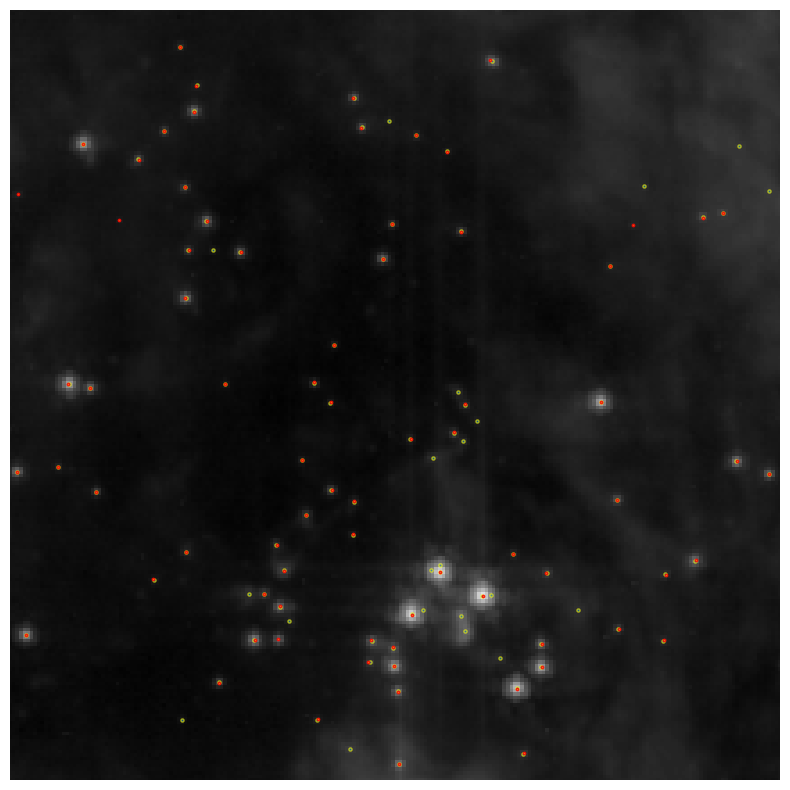

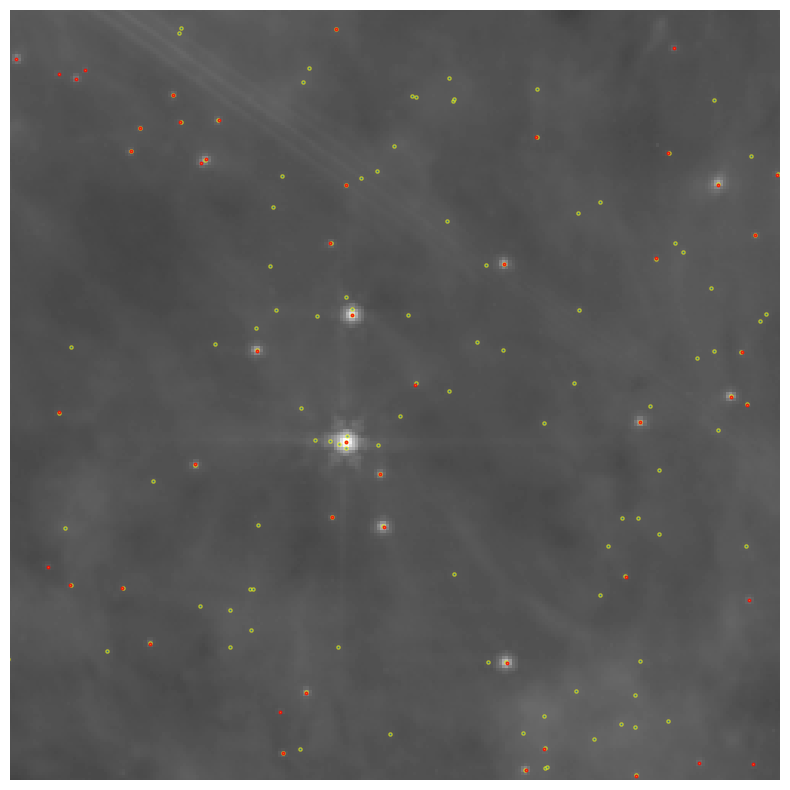

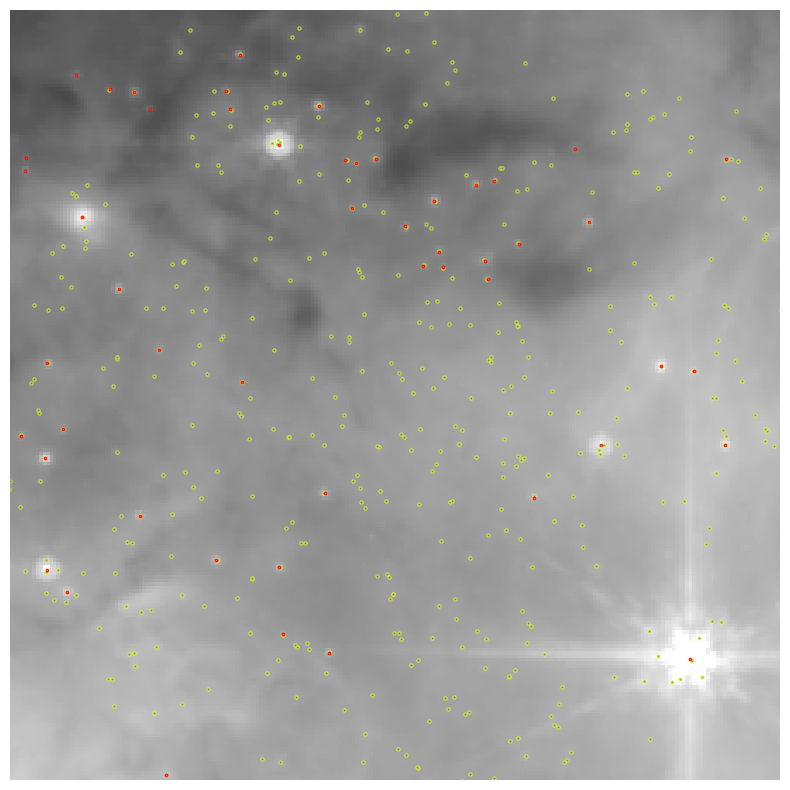

In [8]:
idx, d2d, d3d = by_eye_skycoord.match_to_catalog_sky(nrca_catalog['skycoord'])
print(len(idx), len(nrca_catalog['skycoord']), len(by_eye_skycoord))
print(idx)
matched = d2d < 0.1*u.arcsec
print(f'{len(matched==True)} sources out of {len(matched)} matched within 0.1 arcsec')
matched_skycoord = nrca_catalog['skycoord'][idx[matched]]
contains_arr = np.zeros(len(nrca_catalog['skycoord']), dtype=bool)
for reg in test_regions:
    filename = image_filenames['f560w']
    hdu = fits.open(filename)
    data = hdu[1].data if len(hdu) > 1 else hdu[0].data
    wcs = WCS(hdu[1].header if len(hdu) > 1 else hdu[0].header)
    cutout = Cutout2D(data, reg.center, (reg.height, reg.width), wcs=wcs)
    norm = simple_norm(data, 'log', percent=99.9)
    fig, ax = plt.subplots(1, 1, figsize=(10, 10), subplot_kw={'projection': cutout.wcs})
    ax.imshow(cutout.data, norm=norm, origin='lower', cmap='gray')
    skycoord_ref = nrca_catalog['skycoord']
    contains = reg.contains(skycoord_ref, wcs)
    contains_arr[contains] = True
    #convert skycoordinates to pixel coordinates in the cutout
    pixcoords_matched = cutout.wcs.world_to_pixel(matched_skycoord)
    pixcoords_by_eye_skycoord = cutout.wcs.world_to_pixel(by_eye_skycoord)
    pixcoords_in_reg = cutout.wcs.world_to_pixel(skycoord_ref[contains])
    ra = pixcoords_in_reg[0]
    dec = pixcoords_in_reg[1]
    ax.scatter(ra, dec, s=5, edgecolor='yellow', alpha=0.6) 

    
    ra = pixcoords_by_eye_skycoord[0]
    dec = pixcoords_by_eye_skycoord[1]
    ax.scatter(ra, dec, s=3, edgecolor='red', alpha=0.8)
    
    #ra = pixcoords[0][index] --- IGNORE
    ax.axis('off')
    ax.set_xlim(cutout.xmin_cutout, cutout.xmax_cutout)
    ax.set_ylim(cutout.ymin_cutout, cutout.ymax_cutout)

Set DATE-AVG to '2024-09-08T11:22:58.102' from MJD-AVG.
Set DATE-END to '2024-09-08T12:35:44.015' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.810003 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291940033.618 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
/scratch/local/23155831/ipykernel_2167173/2516500242.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap1 = cm.get_cmap('viridis')
/scratch/local/23155831/ipykernel_2167173/2516500242.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap2 = cm.get_cmap('plasma')


197 sources out of 197 matched within 0.1 arcsec
197 sources out of 197 matched within 0.1 arcsec


/scratch/local/23155831/ipykernel_2167173/2516500242.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap1 = cm.get_cmap('viridis')
/scratch/local/23155831/ipykernel_2167173/2516500242.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap2 = cm.get_cmap('plasma')
/scratch/local/23155831/ipykernel_2167173/2516500242.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap1 = cm.get_cmap('viridis')
/scratch/local/23155831/ipykernel_2167173/2516500242.py:

197 sources out of 197 matched within 0.1 arcsec


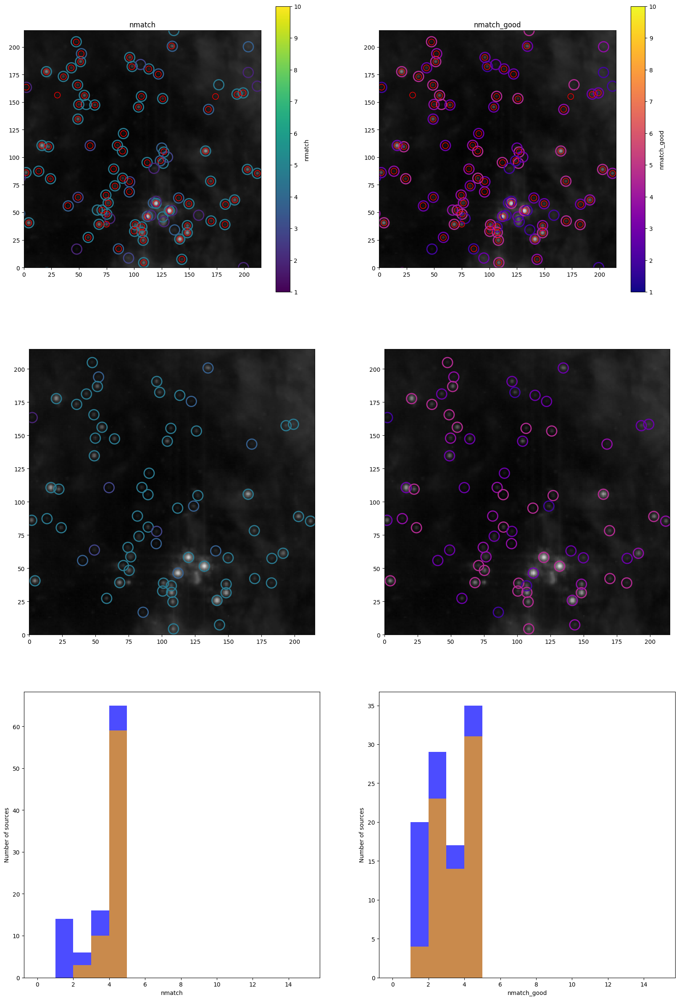

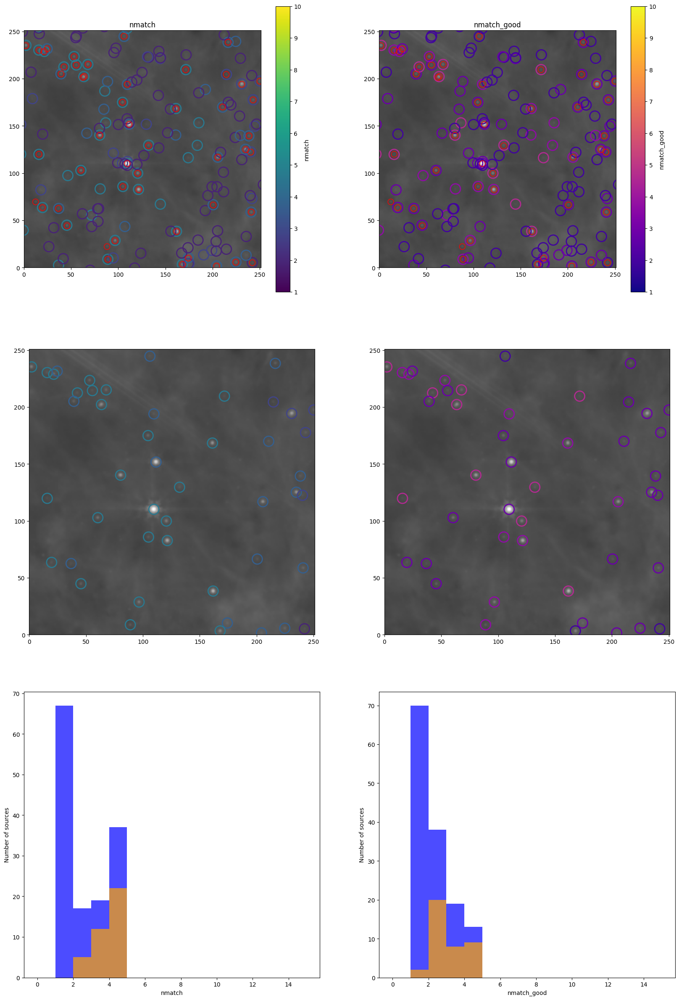

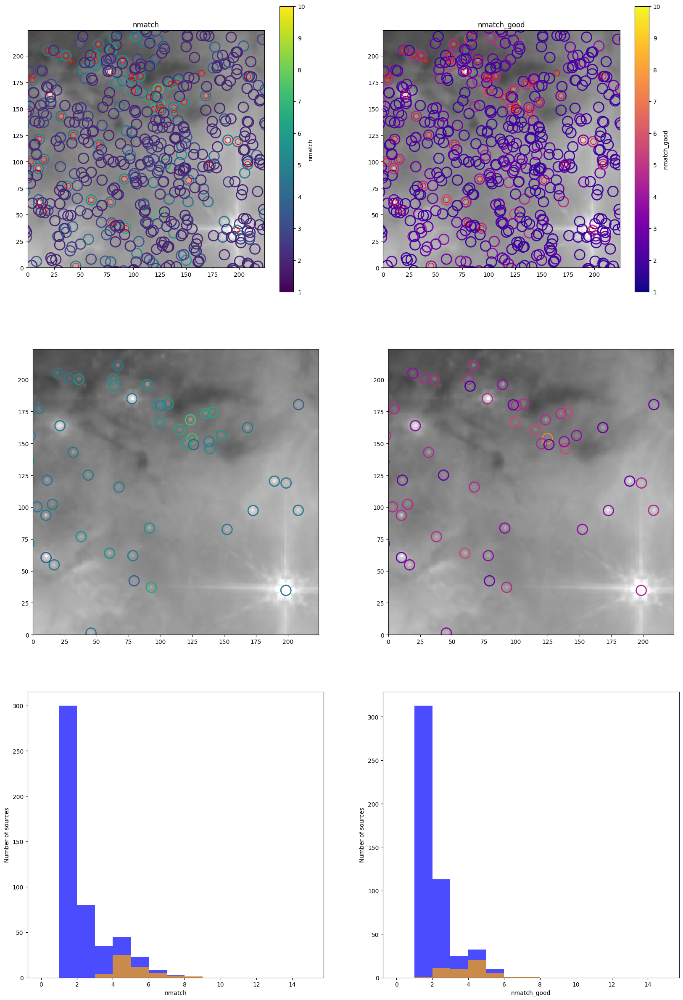

In [9]:
filename = image_filenames['f560w']
hdu = fits.open(filename)
data = hdu[1].data if len(hdu) > 1 else hdu[0].data
wcs = WCS(hdu[1].header if len(hdu) > 1 else hdu[0].header)
norm = simple_norm(data, 'log', percent=99.95)
skycoords = nrca_catalog['skycoord']
for reg in test_regions:
    cutout = Cutout2D(data, reg.center, (reg.height, reg.width), wcs=wcs)
    xpix, ypix = wcs.world_to_pixel(skycoords)
    xpix_by_eye, ypix_by_eye = wcs.world_to_pixel(by_eye_skycoord)




    fig = plt.figure(figsize=(20,30))
    ax1 = fig.add_subplot(3,2,1,)
    ax2 = fig.add_subplot(3,2,2,)
    ax5 = fig.add_subplot(3,2,3,)
    ax6 = fig.add_subplot(3,2,4,)
    ax3 = fig.add_subplot(3,2,5)
    ax4 = fig.add_subplot(3,2,6)
    

    nmatch = nrca_catalog['nmatch']
    nmatch_good = nrca_catalog['nmatch_good']
    import matplotlib.cm as cm
    cmap1 = cm.get_cmap('viridis')
    cmap2 = cm.get_cmap('plasma')

    ax1.imshow(cutout.data, norm=norm, origin='lower', cmap='gray')
    ax2.imshow(cutout.data, norm=norm, origin='lower', cmap='gray')
    ax5.imshow(cutout.data, norm=norm, origin='lower', cmap='gray')
    ax6.imshow(cutout.data, norm=norm, origin='lower', cmap='gray')
    
    
    # Remove 'c' parameter, only use edgecolors
    sc1 = ax1.scatter(xpix-cutout.xmin_original, ypix-cutout.ymin_original, s=300, facecolors='none', edgecolors=cmap1(nmatch/nmatch.max()), linewidths=2, label='nmatch')
    sc2 = ax2.scatter(xpix-cutout.xmin_original, ypix-cutout.ymin_original, s=300, facecolors='none', edgecolors=cmap2(nmatch_good/nmatch_good.max()), linewidths=2, label='nmatch_good')
    ax1.scatter(xpix_by_eye - cutout.xmin_original, ypix_by_eye - cutout.ymin_original, s=100, facecolors='none', edgecolors='red', linewidths=1, label='by eye sources')
    ax2.scatter(xpix_by_eye - cutout.xmin_original, ypix_by_eye - cutout.ymin_original, s=100, facecolors='none', edgecolors='red', linewidths=1, label='by eye sources')
    ax1.set_xlim(cutout.xmin_cutout, cutout.xmax_cutout)
    ax1.set_ylim(cutout.ymin_cutout, cutout.ymax_cutout)
    ax2.set_xlim(cutout.xmin_cutout, cutout.xmax_cutout)
    ax2.set_ylim(cutout.ymin_cutout, cutout.ymax_cutout)
    ax1.set_title('nmatch')

    ax2.set_title('nmatch_good')
    # For colorbar, create a ScalarMappable
    import matplotlib as mpl
    sm1 = mpl.cm.ScalarMappable(cmap=cmap1, norm=mpl.colors.Normalize(vmin=nmatch.min(), vmax=nmatch.max()))
    sm2 = mpl.cm.ScalarMappable(cmap=cmap2, norm=mpl.colors.Normalize(vmin=nmatch_good.min(), vmax=nmatch_good.max()))
    plt.colorbar(sm1, ax=ax1, label='nmatch')
    plt.colorbar(sm2, ax=ax2, label='nmatch_good')

    idx, d2d, d3d = by_eye_skycoord.match_to_catalog_sky(skycoords)
    matched = d2d < 0.1*u.arcsec
    matched_skycoord = skycoords[idx[matched]]  
    print(len(matched==True), 'sources out of', len(matched), 'matched within 0.1 arcsec')
    xpix_matched, ypix_matched = wcs.world_to_pixel(matched_skycoord)
    sc1 = ax5.scatter(xpix_matched-cutout.xmin_original, ypix_matched-cutout.ymin_original, s=300, facecolors='none', edgecolors=cmap1(nmatch[idx[matched]]  /nmatch.max()), linewidths=2, label='nmatch')
    sc2 = ax6.scatter(xpix_matched-cutout.xmin_original, ypix_matched-cutout.ymin_original, s=300, facecolors='none', edgecolors=cmap2(nmatch_good[idx[matched]] /nmatch_good.max()), linewidths=2, label='nmatch_good')
    ax5.set_xlim(cutout.xmin_cutout, cutout.xmax_cutout)
    ax5.set_ylim(cutout.ymin_cutout, cutout.ymax_cutout)
    ax6.set_xlim(cutout.xmin_cutout, cutout.xmax_cutout)

    ax6.set_ylim(cutout.ymin_cutout, cutout.ymax_cutout)
    hist_bins = np.arange(16)
    contains = reg.contains(skycoords, wcs)
    containes_matched = reg.contains(skycoords[idx[matched]], wcs)
    ax3.hist(nrca_catalog['nmatch'][contains], bins=hist_bins, color='blue', alpha=0.7)
    ax3.hist(nrca_catalog['nmatch'][idx[matched]][containes_matched], bins=hist_bins, color='orange', alpha=0.7)
    ax3.set_xlabel('nmatch')
    ax3.set_ylabel('Number of sources')
    ax4.hist(nrca_catalog['nmatch_good'][contains], bins=hist_bins, color='blue', alpha=0.7)
    ax4.hist(nrca_catalog['nmatch_good'][idx[matched]][containes_matched], bins=hist_bins, color='orange', alpha=0.7)
    ax4.set_xlabel('nmatch_good')
    ax4.set_ylabel('Number of sources')
    

    